<a href="https://colab.research.google.com/github/nedokormysh/GB_NLP_intro/blob/lesson5/GB_NLP_intro_hw_5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Тема «POS-tagger и NER»



## Задание 1.

Написать теггер на данных с русским языком
проверить UnigramTagger, BigramTagger, TrigramTagger и их комбинации

написать свой теггер как на занятии, попробовать разные векторайзеры, добавить знание не только букв но и слов

сравнить все реализованные методы, сделать выводы 


In [ ]:
!pip install corus -q
!pip install pyconll -q
!pip install razdel -q
!pip install -U spacy -q

In [20]:
import nltk
from nltk.tokenize import word_tokenize
import matplotlib
%matplotlib inline

from nltk.tag import DefaultTagger
from nltk.tag import UnigramTagger, BigramTagger, TrigramTagger

from sklearn.feature_extraction.text import CountVectorizer, HashingVectorizer, TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from sklearn.preprocessing import LabelEncoder

import warnings
warnings.filterwarnings("ignore")

import corus
import pandas as pd
import numpy as np

import pyconll

In [ ]:
!mkdir dataset_ru

!wget -O ./dataset_ru/ru_syntagrus-ud-train-a.conllu https://raw.githubusercontent.com/UniversalDependencies/UD_Russian-SynTagRus/master/ru_syntagrus-ud-train-a.conllu
!wget -O ./dataset_ru/ru_syntagrus-ud-train-b.conllu https://raw.githubusercontent.com/UniversalDependencies/UD_Russian-SynTagRus/master/ru_syntagrus-ud-train-b.conllu
!wget -O ./dataset_ru/ru_syntagrus-ud-train-c.conllu https://raw.githubusercontent.com/UniversalDependencies/UD_Russian-SynTagRus/master/ru_syntagrus-ud-train-c.conllu
!wget -O ./dataset_ru/ru_syntagrus-ud-dev.conllu https://raw.githubusercontent.com/UniversalDependencies/UD_Russian-SynTagRus/master/ru_syntagrus-ud-dev.conllu

--2023-03-08 17:48:52--  https://raw.githubusercontent.com/UniversalDependencies/UD_Russian-SynTagRus/master/ru_syntagrus-ud-train-a.conllu
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 40736581 (39M) [text/plain]
Saving to: ‘./dataset_ru/ru_syntagrus-ud-train-a.conllu’

./dataset_ru/ru_syn 100%[===================>]  38.85M  --.-KB/s    in 0.1s    

2023-03-08 17:48:54 (345 MB/s) - ‘./dataset_ru/ru_syntagrus-ud-train-a.conllu’ saved [40736581/40736581]

--2023-03-08 17:48:54--  https://raw.githubusercontent.com/UniversalDependencies/UD_Russian-SynTagRus/master/ru_syntagrus-ud-train-b.conllu
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.

In [ ]:
full_train = pyconll.load_from_file('dataset_ru/ru_syntagrus-ud-train-a.conllu')
full_train_b = pyconll.load_from_file('dataset_ru/ru_syntagrus-ud-train-b.conllu')
full_train_c = pyconll.load_from_file('dataset_ru/ru_syntagrus-ud-train-c.conllu')

# Общая обучающая выборка
full_train.extend([*full_train_b, *full_train_c])

full_test = pyconll.load_from_file('dataset_ru/ru_syntagrus-ud-dev.conllu')

Пример текста.

In [ ]:
for sent in full_test[1:2]:
    for token in sent:
        print(token.form, token.upos)
    print()

В ADP
старой ADJ
трактовке NOUN
вместо ADP
слова NOUN
" PUNCT
порядок NOUN
" PUNCT
использовалось VERB
слово NOUN
" PUNCT
последовательность NOUN
" PUNCT
, PUNCT
но CCONJ
по ADP
мере NOUN
развития NOUN
параллельности NOUN
в ADP
работе NOUN
компьютеров NOUN
слово NOUN
" PUNCT
последовательность NOUN
" PUNCT
стали VERB
заменять VERB
более ADV
общим ADJ
словом NOUN
" PUNCT
порядок NOUN
" PUNCT
. PUNCT



Преобразовываем выборке

In [ ]:
fdata_train = []
for sent in full_train[:]:
    fdata_train.append([(token.form, token.upos) for token in sent])
    
fdata_test = []
for sent in full_test[:]:
    fdata_test.append([(token.form, token.upos) for token in sent])
    
fdata_sent_test = []
for sent in full_test[:]:
    fdata_sent_test.append([token.form for token in sent])

### Default tagger

In [ ]:
%%time

default_tagger = DefaultTagger('NOUN')

display(default_tagger.tag(fdata_sent_test[7575]))
display(default_tagger.evaluate(fdata_test))

[('К', 'NOUN'),
 ('тому', 'NOUN'),
 ('же', 'NOUN'),
 ('центры', 'NOUN'),
 ('аграрных', 'NOUN'),
 ('цивилизаций', 'NOUN'),
 ('умышленно', 'NOUN'),
 ('отодвигались', 'NOUN'),
 ('от', 'NOUN'),
 ('побережья', 'NOUN'),
 ('.', 'NOUN')]

0.23593983983332248

CPU times: user 176 ms, sys: 10.1 ms, total: 186 ms
Wall time: 189 ms


### Unigram

In [ ]:
%%time
unigram_tagger = UnigramTagger(fdata_train)

display(unigram_tagger.tag(fdata_sent_test[7575]))
display(unigram_tagger.evaluate(fdata_test))

[('К', 'ADP'),
 ('тому', 'PRON'),
 ('же', 'PART'),
 ('центры', 'NOUN'),
 ('аграрных', 'ADJ'),
 ('цивилизаций', 'NOUN'),
 ('умышленно', 'ADV'),
 ('отодвигались', None),
 ('от', 'ADP'),
 ('побережья', 'NOUN'),
 ('.', 'PUNCT')]

0.8782863467673677

CPU times: user 3.47 s, sys: 66.3 ms, total: 3.54 s
Wall time: 3.56 s


### Bigram

In [ ]:
%%time

bigram_tagger = BigramTagger(fdata_train)

display(bigram_tagger.tag(fdata_sent_test[7575]))
display(bigram_tagger.evaluate(fdata_test))

[('К', 'ADP'),
 ('тому', 'PRON'),
 ('же', 'PART'),
 ('центры', None),
 ('аграрных', None),
 ('цивилизаций', None),
 ('умышленно', None),
 ('отодвигались', None),
 ('от', 'ADP'),
 ('побережья', 'NOUN'),
 ('.', 'PUNCT')]

0.7101308678950452

CPU times: user 6.4 s, sys: 123 ms, total: 6.52 s
Wall time: 6.59 s


### Trigram

In [ ]:
%%time

trigram_tagger = TrigramTagger(fdata_train)

display(trigram_tagger.tag(fdata_sent_test[7575]))
display(trigram_tagger.evaluate(fdata_test))

[('К', 'ADP'),
 ('тому', 'PRON'),
 ('же', 'PART'),
 ('центры', None),
 ('аграрных', None),
 ('цивилизаций', None),
 ('умышленно', None),
 ('отодвигались', None),
 ('от', 'ADP'),
 ('побережья', None),
 ('.', None)]

0.4067191874470994

CPU times: user 9.63 s, sys: 192 ms, total: 9.82 s
Wall time: 9.87 s


Лучше всего показал подход unigram. Создадим комбинацию тэггеров. Дефолтный тэг - существительное.

In [ ]:
def backoff_tagger(train_sents, tagger_classes, backoff=None):
    for cls in tagger_classes:
        backoff = cls(train_sents, backoff=backoff)
    return backoff

backoff = DefaultTagger('NOUN') 
tag = backoff_tagger(fdata_train,  
                     [UnigramTagger, BigramTagger, TrigramTagger],  
                     backoff = backoff) 
  
tag.evaluate(fdata_test)

0.9119799466111075

Теперь построим модель тэггера на основе разных векторайзеров, которая будет фактически классифицировать каждое слово из датасета.

Подготовим обучающий и тестовый наборы данных.

In [ ]:
train_tok = []
train_label = []
for sent in fdata_train[:]:
    for tok in sent:
        if (tok[0] is None) or (tok[1] is None):
            continue
        train_tok.append(tok[0])
        train_label.append('NO_TAG' if tok[1] is None else tok[1])
        
test_tok = []
test_label = []
for sent in fdata_test[:]:
    for tok in sent:
        if (tok[0] is None) or (tok[1] is None):
            continue
        test_tok.append(tok[0])
        test_label.append('NO_TAG' if tok[1] is None else tok[1])

In [ ]:
le = LabelEncoder()
train_enc_labels = le.fit_transform(train_label)
test_enc_labels = le.transform(test_label)

In [ ]:
le.classes_

array(['ADJ', 'ADP', 'ADV', 'AUX', 'CCONJ', 'DET', 'INTJ', 'NOUN', 'NUM',
       'PART', 'PRON', 'PROPN', 'PUNCT', 'SCONJ', 'SYM', 'VERB', 'X'],
      dtype='<U5')

### Count Vectorizer

In [ ]:
cvtr = CountVectorizer(ngram_range=(1, 3), analyzer='char')

X_train = cvtr.fit_transform(train_tok)
X_test = cvtr.transform(test_tok)

lr = LogisticRegression(random_state=7575, n_jobs=8, max_iter=20)
lr.fit(X_train, train_enc_labels)

pred = lr.predict(X_test)
display(accuracy_score(test_enc_labels, pred))

0.8514267079732594

### Hashing Vectorizer


In [ ]:
hvtr = HashingVectorizer(ngram_range=(1, 3), analyzer='char', n_features=100)

X_train = hvtr.fit_transform(train_tok)
X_test = hvtr.transform(test_tok)

lr = LogisticRegression(random_state=0, n_jobs=8, max_iter=20)
lr.fit(X_train, train_enc_labels)

pred = lr.predict(X_test)
display(accuracy_score(test_enc_labels, pred))

0.6735626936246535

### Tfidf Vectorizer

In [ ]:
tfvtr = TfidfVectorizer(ngram_range=(1, 3), analyzer='char')

X_train = tfvtr.fit_transform(train_tok)
X_test = tfvtr.transform(test_tok)

lr = LogisticRegression(random_state=0, n_jobs=8, max_iter=20)
lr.fit(X_train, train_enc_labels)

pred = lr.predict(X_test)
display(accuracy_score(test_enc_labels, pred))

0.8065416598728192

Среди векторайзеров лучший результат у count vectorizer. Но можрно было достаточно сильно изменять параметры, брать больше признаков или слов.

В таком сценарии пока лучший результат у комбинации стандартных тэггеров.

## Задание 2.

Проверить, насколько хорошо работает NER
Данные брать из http://www.labinform.ru/pub/named_entities/
проверить NER из nltk/spacy/deeppavlov.

написать свой NER, попробовать разные подходы.

передаём в сетку токен и его соседей.

передаём в сетку только токен.

*italicized text*
свой вариант.
сравнить свои реализованные подходы на качество — вывести precision/recall/f1_score.


In [3]:
!wget http://www.labinform.ru/pub/named_entities/collection5.zip -q
!unzip collection5.zip

Archive:  collection5.zip
   creating: Collection5/
  inflating: Collection5/001.ann     
  inflating: Collection5/001.txt     
  inflating: Collection5/002.ann     
  inflating: Collection5/002.txt     
  inflating: Collection5/003.ann     
  inflating: Collection5/003.txt     
  inflating: Collection5/004.ann     
  inflating: Collection5/004.txt     
  inflating: Collection5/005.ann     
  inflating: Collection5/005.txt     
  inflating: Collection5/006.ann     
  inflating: Collection5/006.txt     
  inflating: Collection5/007.ann     
  inflating: Collection5/007.txt     
  inflating: Collection5/008.ann     
  inflating: Collection5/008.txt     
  inflating: Collection5/009.ann     
  inflating: Collection5/009.txt     
  inflating: Collection5/010.ann     
  inflating: Collection5/010.txt     
  inflating: Collection5/011.ann     
  inflating: Collection5/011.txt     
  inflating: Collection5/012.ann     
  inflating: Collection5/012.txt     
  inflating: Collection5/013.ann    

In [1]:
!pip install natasha corus
!pip -q install spacy
!python -m spacy download ru_core_news_md

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 34.4/34.4 MB 44.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.5/83.5 KB 11.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.7/46.7 KB 5.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.5/55.5 KB 1.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.2/8.2 MB 64.6 MB/s eta 0:00:00
  Created wheel for docopt: filename=docopt-0.6.2-py2.py3-none-any.whl size=13723 sha256=6922157f757b6c0c912797bb20c31a67691621da91df0d522233abc38f4a1563
  Stored in directory: /root/.cache/pip/wheels/70/4a/46/1309fc853b8d395e60bafaf1b6df7845bdd82c95fd59dd8d2b
  Created wheel for intervaltree: filename=intervaltree-3.1.0-py2.py3-none-any.whl size=26118 sha256=3f17b8afee56fb9d65d3b4cd8a572f7af85a4127a047119b69e19728

In [4]:
from corus import load_ne5

path_coll5 = 'Collection5/'
records = load_ne5(path_coll5)
next(records)

Ne5Markup(
    id='527',
    text='"Тролливший" оппозицию вице-губернатор Приморья уволен\r\n\r\nВице-губернатор Приморского края Александр Шемелев лишился своего поста. Как пишет "Коммерсантъ", он поплатился своей должностью за низкий результат "Единой России" на выборах в Госдуму. Член политсовета местного отделения партии на условиях анонимности заявил, что чиновник стал "ритуальной жертвой для Москвы".\r\n\r\nПо данным "Коммерсанта", сейчас Шемелев находится в отпуске, сразу после которого будет уволен по собственному желанию. Он уже написал соответствующее заявление.\r\n\r\nОфициально в пресс-службе администрации Приморского края информацию об отставке не подтвердили. Сам Шемелев от комментариев отказался.\r\n\r\nПока единственным его высказыванием по поводу отставки можно считать ответ на твит зампреда Федерального комитета по борьбе с коррупцией в высших эшелонах власти (структура, входящая в незарегистрированную партию бывшего мэра Владивостока Виктора Черепкова) Дениса Головча

In [5]:
from razdel import tokenize
import pandas as pd

In [6]:
words_docs = []
for ix, rec in enumerate(records):
    words = []
    for token in tokenize(rec.text):
        type_ent = 'OUT'
        for ent in rec.spans:
            if (token.start >= ent.start) and (token.stop <= ent.stop):
                type_ent = ent.type
                break
        words.append([token.text, type_ent])
    words_docs.extend(words)

In [7]:
df_words = pd.DataFrame(words_docs, columns=['word', 'tag'])

In [5]:
df_words['tag'].value_counts()

OUT         219013
PER          21178
ORG          13642
LOC           4560
GEOPOLIT      4356
MEDIA         2482
Name: tag, dtype: int64

In [ ]:
df_words.head(5)

,word,tag
0,Президент,OUT
1,США,GEOPOLIT
2,назначил,OUT
3,четырех,OUT
4,послов,OUT


In [ ]:
df_words.shape

(265231, 2)

In [ ]:
records = load_ne5(path_coll5)
text = next(records).text

### NLTK

In [ ]:
import nltk
nltk.download('words')
nltk.download('maxent_ne_chunker')
nltk.download('names')
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package words to /root/nltk_data...
[nltk_data]   Unzipping corpora/words.zip.
[nltk_data] Downloading package maxent_ne_chunker to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping chunkers/maxent_ne_chunker.zip.
[nltk_data] Downloading package names to /root/nltk_data...
[nltk_data]   Unzipping corpora/names.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.


True

In [ ]:
# nltk

{(' '.join(c[0] for c in chunk), chunk.label() ) for chunk in nltk.ne_chunk(nltk.pos_tag(nltk.word_tokenize(text))) if hasattr(chunk, 'label') }

{('Бахарь', 'PERSON'),
 ('Владимир', 'GPE'),
 ('Галина Пашинова', 'PERSON'),
 ('Красноярского', 'ORGANIZATION'),
 ('Наталья Кузьмина', 'PERSON'),
 ('Пашинова', 'PERSON'),
 ('Уставом Красноярского', 'PERSON'),
 ('Уточняется', 'PERSON')}

### Spancy

In [ ]:
# !pip install spacy

# !pip install https://github.com/explosion/spacy-models/releases/download/ru_core_news_sm-3.1.0/ru_core_news_sm-3.1.0.tar.gz -q

In [ ]:
# spacy

import spacy
# import ru_core_news_sm
from spacy import displacy

nlp = spacy.load('ru_core_news_md')

# nlp = ru_core_news_sm.load()

docs = nlp(text)
displacy.render(docs, jupyter=True, style='ent')

Spancy справился лучше, чем nltk

Посмотрим на spancy, но проведём обработку данных с создадим файлы с BIO разметкой.

In [ ]:
docs = []
for rec in records:
    words = []
    labels = []
    idx_ent = -1
    len_ents = len(rec.spans)
    rec_entities = sorted(rec.spans, key=lambda v: v.start)
    ent = None
    is_start = None
    for token in tokenize(rec.text):
        type_ent = 'OUT'
        if len_ents == 0:
            words.append(token.text)
            labels.append(type_ent)
            continue

        if (idx_ent == -1) or (idx_ent + 1 < len_ents and token.start > ent.stop):
            idx_ent += 1
            ent = rec_entities[idx_ent]
            is_start = True

        if (token.start >= ent.start) and (token.stop <= ent.stop):
                type_ent = 'B-' + ent.type if is_start else 'I-' + ent.type
                is_start = False
        words.append(token.text)
        labels.append(type_ent)
    
    docs.append([words, labels])
     

In [ ]:
docs

[[['Президент',
   'США',
   'назначил',
   'четырех',
   'послов',
   'в',
   'обход',
   'Сената',
   'Президент',
   'США',
   'Барак',
   'Обама',
   'воспользовался',
   'парламентскими',
   'каникулами',
   ',',
   'чтобы',
   'назначить',
   'четырех',
   'послов',
   ',',
   'сообщает',
   'Associated',
   'Press',
   'в',
   'среду',
   ',',
   '29',
   'декабря',
   '.',
   'По',
   'американским',
   'законам',
   ',',
   'кандидатуры',
   'послов',
   'США',
   ',',
   'вносимые',
   'президентом',
   ',',
   'должна',
   'одобрить',
   'верхняя',
   'палата',
   'Конгресса',
   '.',
   'Однако',
   'в',
   'момент',
   'парламентских',
   'каникул',
   'у',
   'президента',
   'США',
   'есть',
   'право',
   'единолично',
   'принимать',
   'решение',
   'о',
   'назначении',
   'послов',
   '.',
   'Обама',
   'воспользовался',
   'такой',
   'возможностью',
   ',',
   'предоставляемой',
   'законодательством',
   ',',
   'для',
   'того',
   ',',
   'чтобы',
   'назначи

In [ ]:
print(docs[0][0])
print(docs[0][1])

['Президент', 'США', 'назначил', 'четырех', 'послов', 'в', 'обход', 'Сената', 'Президент', 'США', 'Барак', 'Обама', 'воспользовался', 'парламентскими', 'каникулами', ',', 'чтобы', 'назначить', 'четырех', 'послов', ',', 'сообщает', 'Associated', 'Press', 'в', 'среду', ',', '29', 'декабря', '.', 'По', 'американским', 'законам', ',', 'кандидатуры', 'послов', 'США', ',', 'вносимые', 'президентом', ',', 'должна', 'одобрить', 'верхняя', 'палата', 'Конгресса', '.', 'Однако', 'в', 'момент', 'парламентских', 'каникул', 'у', 'президента', 'США', 'есть', 'право', 'единолично', 'принимать', 'решение', 'о', 'назначении', 'послов', '.', 'Обама', 'воспользовался', 'такой', 'возможностью', ',', 'предоставляемой', 'законодательством', ',', 'для', 'того', ',', 'чтобы', 'назначить', 'послов', 'в', 'Азербайджан', ',', 'Сирию', ',', 'Турцию', 'и', 'Чехию', '.', 'Президент', 'США', 'еще', 'несколько', 'месяцев', 'назад', 'представил', 'Сенату', 'кандидатов', 'на', 'эти', 'должности', ',', 'однако', 'законод

In [ ]:
with open('c5.bio', 'w') as w:
    with open('c5_train.bio', 'w') as w1:
        with open('c5_valid.bio', 'w') as w2:
            for irec, rec in enumerate(docs):
                for line in map(lambda vl: '\t'.join(vl) + '\n', zip(*rec)):
                    w.write(line)
                    if irec < len(docs) * 0.7: #3000
                        w1.write(line)
                    else:
                        w2.write(line)
                w.write('\n')
                if irec < len(docs) * 0.7: #3000
                    w1.write('\n')
                else:
                    w2.write('\n')

In [ ]:
!python -m spacy init config base_config.cfg -F -p  ner -l ru
!python -m spacy init fill-config base_config.cfg config.cfg
# !python -m spacy convert c5.bio . -t json -c ner
!python -m spacy convert c5_train.bio . -c ner
!python -m spacy convert c5_valid.bio . -c ner

/usr/local/lib/python3.9/dist-packages/torch/cuda/__init__.py:497: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
2023-03-08 17:58:22.859423: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-03-08 17:58:22.859533: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-03-08 17:58:22.859551: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentione

Обучаем модель.

In [ ]:
!python -m spacy train config.cfg --output ./output --paths.train c5_train.spacy --paths.dev c5_valid.spacy

/usr/local/lib/python3.9/dist-packages/torch/cuda/__init__.py:497: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
2023-03-08 17:59:00.854759: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-03-08 17:59:00.854909: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-03-08 17:59:00.854936: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentione

Посмотрим на результаты обученной модели.

In [ ]:
!python -m spacy evaluate output/model-last c5_valid.spacy     

/usr/local/lib/python3.9/dist-packages/torch/cuda/__init__.py:497: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
2023-03-08 18:22:20.655318: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-03-08 18:22:20.655512: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-03-08 18:22:20.655536: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentione

### Deeppavlov

In [ ]:
# !pip install deeppavlov -q
# !python -m deeppavlov install squad_bert -q
# !python -m deeppavlov install ner_ontonotes -q
# !pip install transformers -q

In [ ]:
# !pip install tensorflow==1.15

In [ ]:
# import deeppavlov
# from deeppavlov import configs, build_model

# ner_model = build_model(configs.ner., download=True)

Не удалось запустить deeppavlov

### Natasha

In [ ]:
!pip install natasha

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from natasha import (
    Segmenter,
    MorphVocab,
    
    NewsEmbedding,
    NewsMorphTagger,
    NewsSyntaxParser,
    NewsNERTagger,
    
    PER,
    NamesExtractor,

    Doc
)

In [ ]:
segmenter = Segmenter()
morph_vocab = MorphVocab()

emb = NewsEmbedding()
morph_tagger = NewsMorphTagger(emb)
syntax_parser = NewsSyntaxParser(emb)
ner_tagger = NewsNERTagger(emb)

names_extractor = NamesExtractor(morph_vocab)

text = text
doc = Doc(text)

In [ ]:
doc.segment(segmenter)
display(doc.tokens[:5])
display(doc.sents[:5])

[DocToken(start=2, stop=14, text='Красноярский'),
 DocToken(start=15, stop=25, text='губернатор'),
 DocToken(start=26, stop=34, text='назначил'),
 DocToken(start=35, stop=40, text='новых'),
 DocToken(start=41, stop=50, text='министров')]

[DocSent(start=2, stop=172, text='Красноярский губернатор назначил новых министров ..., tokens=[...]),
 DocSent(start=173, stop=329, text='Галина Пашинова стала вице-губернатором, курирующ..., tokens=[...]),
 DocSent(start=332, stop=596, text='Губернатор Красноярского края Лев Кузнецов в сред..., tokens=[...]),
 DocSent(start=600, stop=844, text='"На должность заместителя губернатора — заместите..., tokens=[...]),
 DocSent(start=848, stop=1039, text='Пост вице-губернатора, курирующего в кабмине реги..., tokens=[...])]

In [ ]:
doc.segment(segmenter)
doc.tag_morph(morph_tagger)
doc.parse_syntax(syntax_parser)
sent = doc.sents[0]
sent.morph.print()

        Красноярский ADJ|Case=Nom|Degree=Pos|Gender=Masc|Number=Sing
          губернатор NOUN|Animacy=Anim|Case=Nom|Gender=Masc|Number=Sing
            назначил VERB|Aspect=Perf|Gender=Masc|Mood=Ind|Number=Sing|Tense=Past|VerbForm=Fin|Voice=Act
               новых ADJ|Animacy=Anim|Case=Acc|Degree=Pos|Number=Plur
           министров NOUN|Animacy=Anim|Case=Acc|Gender=Masc|Number=Plur
                   и CCONJ
         заместителя NOUN|Animacy=Anim|Case=Gen|Gender=Masc|Number=Sing
          Губернатор NOUN|Animacy=Anim|Case=Nom|Gender=Masc|Number=Sing
       Красноярского ADJ|Case=Gen|Degree=Pos|Gender=Masc|Number=Sing
                края NOUN|Animacy=Inan|Case=Gen|Gender=Masc|Number=Sing
                 Лев PROPN|Animacy=Anim|Case=Nom|Gender=Masc|Number=Sing
            Кузнецов PROPN|Animacy=Anim|Case=Nom|Gender=Masc|Number=Sing
                   в ADP
               среду NOUN|Animacy=Inan|Case=Acc|Gender=Fem|Number=Sing
            назначил VERB|Aspect=Perf|Gender=Masc|Mood=Ind

In [ ]:
sent.syntax.print()

            ┌► Красноярский  amod
          ┌►└─ губернатор    nsubj
┌───────┌─└─── назначил      
│       │   ┌► новых         amod
│ ┌───┌─└──►└─ министров     obj
│ │   │     ┌► и             cc
│ │ ┌─└──►┌─└─ заместителя   conj
│ │ │   ┌─└──► Губернатор    appos
│ │ │   │   ┌► Красноярского amod
│ │ │   └──►└─ края          nmod
│ │ └──────►┌─ Лев           appos
│ │         └► Кузнецов      flat:name
│ │         ┌► в             case
│ │       ┌►└─ среду         obl
│ │     ┌─└─── назначил      
│ │     │ ┌──► двух          nummod
│ │     │ │ ┌► новых         amod
│ │     └►└─└─ министров     obj
│ │       ┌──► и             cc
│ │       │ ┌► одного        nummod
│ └──────►└─└─ заместителя   conj
└────────────► .             punct


In [ ]:
doc.tag_ner(ner_tagger)
doc.ner.print()

Красноярский губернатор назначил новых министров и заместителя
Губернатор Красноярского края Лев Кузнецов в среду назначил двух новых
           LOC─────────────── PER─────────                            
 министров и одного заместителя. Галина Пашинова стала вице-
                                 PER────────────            
губернатором, курирующим социальный блок, главой Крайобрнауки 
                                                 PER───────── 
назначена Светлана Маковская, министром финансов - Владимир Бахарь.
          PER───────────────                       PER──────────── 
 Губернатор Красноярского края Лев Кузнецов в среду произвел ряд 
            LOC─────────────── PER─────────                      
назначений в кабинете министров регионального правительства: назначен 
новый министр финансов, глава Крайобрнауки, а также вице-губернатор, 
                              ORG─────────                           
курирующий весь социальный блок, сообщило правительство края.
"На до

### Собственный NER

In [8]:
import tensorflow as tf

from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, Embedding, GlobalAveragePooling1D, GlobalMaxPooling1D, Conv1D, GRU, LSTM, Dropout, Input
from tensorflow.keras.layers.experimental.preprocessing import TextVectorization

In [9]:
from sklearn import model_selection, preprocessing, linear_model

train_x, valid_x, train_y, valid_y = model_selection.train_test_split(df_words['word'], df_words['tag'])

# labelEncode целевую переменную
encoder = preprocessing.LabelEncoder()
train_y = encoder.fit_transform(train_y)
valid_y = encoder.fit_transform(valid_y)

In [10]:
train_x.apply(len).max(axis=0)

55

In [11]:
train_data = tf.data.Dataset.from_tensor_slices((train_x, train_y))
valid_data = tf.data.Dataset.from_tensor_slices((valid_x, valid_y))

train_data = train_data.batch(32)
valid_data = valid_data.batch(32)

In [12]:
AUTOTUNE = tf.data.AUTOTUNE

train_data = train_data.cache().prefetch(buffer_size=AUTOTUNE)
valid_data = valid_data.cache().prefetch(buffer_size=AUTOTUNE)

In [13]:
def custom_standardization(input_data):
    return input_data

vocab_size = 30000
seq_len = 10

# без соседних токенов 
vectorize_layer = TextVectorization(
    standardize=custom_standardization,
    max_tokens=vocab_size,
    output_mode='int',
    # ngrams=(1, 3),
    output_sequence_length=seq_len)

# триграммы
vectorize_layer_n13 = TextVectorization(
    standardize=custom_standardization,
    max_tokens=vocab_size,
    output_mode='int',
    ngrams=(1, 3),
    output_sequence_length=seq_len)
# 4 граммы
vectorize_layer_n4 = TextVectorization(
    standardize=custom_standardization,
    max_tokens=vocab_size,
    output_mode='int',
    ngrams=4,
    output_sequence_length=seq_len)

# Make a text-only dataset (no labels) and call adapt to build the vocabulary.
text_data = train_data.map(lambda x, y: x)
vectorize_layer.adapt(text_data)

Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089


In [12]:
len(vectorize_layer.get_vocabulary())

29920

In [14]:
embedding_dim = 128

modeln = Sequential([
    vectorize_layer,
    Embedding(vocab_size, embedding_dim),
    Conv1D(embedding_dim, 3),
    Conv1D(embedding_dim, 2),
    GRU(350),
    Dense(200, activation='relu'),
    Dense(6, activation='softmax')
])

In [15]:
modeln.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(),
              metrics=['accuracy'])

In [16]:
modeln.fit(train_data, validation_data=valid_data, epochs=3)

Epoch 1/3
6215/6215 [==============================] - 68s 9ms/step - loss: 0.3409 - accuracy: 0.8979 - val_loss: 0.2342 - val_accuracy: 0.9286
Epoch 2/3
6215/6215 [==============================] - 51s 8ms/step - loss: 0.1541 - accuracy: 0.9524 - val_loss: 0.2159 - val_accuracy: 0.9367
Epoch 3/3
6215/6215 [==============================] - 52s 8ms/step - loss: 0.1244 - accuracy: 0.9613 - val_loss: 0.4397 - val_accuracy: 0.8925


In [21]:
import numpy as np

labels_predict_n = modeln.predict(valid_data)
class_preds_n = np.argmax(tf.nn.softmax(labels_predict_n), axis=1)
class_preds_n = encoder.inverse_transform(class_preds_n)
valid_y = encoder.inverse_transform(valid_y)
print(classification_report(valid_y, class_preds_n))

2072/2072 [==============================] - 12s 6ms/step
              precision    recall  f1-score   support

    GEOPOLIT       0.83      0.90      0.86      1075
         LOC       0.83      0.73      0.78      1111
       MEDIA       0.91      0.72      0.80       620
         ORG       0.85      0.56      0.68      3455
         OUT       0.97      0.92      0.94     54795
         PER       0.50      0.88      0.64      5228

    accuracy                           0.89     66284
   macro avg       0.81      0.79      0.78     66284
weighted avg       0.92      0.89      0.90     66284



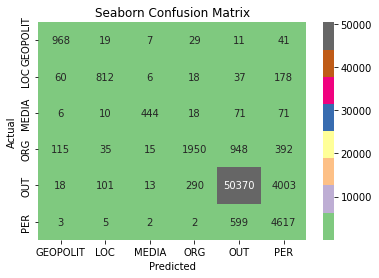

In [22]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score

cm = confusion_matrix(valid_y, class_preds_n)
ax = sns.heatmap(cm, annot=True, fmt='g', cmap="Accent")

ax.set_title('Seaborn Confusion Matrix')
ax.set_xlabel('Predicted')
ax.set_ylabel('Actual')

## For the Tick Labels, the labels should be in Alphabetical order
ax.xaxis.set_ticklabels(['GEOPOLIT', 'LOC', 'MEDIA', 'ORG', 'OUT', 'PER'])
ax.yaxis.set_ticklabels(['GEOPOLIT', 'LOC', 'MEDIA', 'ORG', 'OUT', 'PER'])

plt.show()

In [23]:
vectorize_layer_n13.adapt(text_data)

modeln13 = Sequential([
    vectorize_layer_n13,
    Embedding(vocab_size, embedding_dim),
    Conv1D(embedding_dim, 3),
    Conv1D(embedding_dim, 2),
    GRU(350),
    Dense(200, activation='relu'),
    Dense(6, activation='softmax')
])

modeln13.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(),
              metrics=['accuracy'])

modeln13.fit(train_data, validation_data=valid_data, epochs=3)

Epoch 1/3
6215/6215 [==============================] - 64s 10ms/step - loss: 0.3300 - accuracy: 0.9025 - val_loss: 0.2310 - val_accuracy: 0.9309
Epoch 2/3
6215/6215 [==============================] - 61s 10ms/step - loss: 0.1500 - accuracy: 0.9546 - val_loss: 0.2162 - val_accuracy: 0.9369
Epoch 3/3
6215/6215 [==============================] - 56s 9ms/step - loss: 0.1241 - accuracy: 0.9612 - val_loss: 0.4015 - val_accuracy: 0.8917


In [24]:
labels_predict_n13 = modeln13.predict(valid_data)
class_preds_n13 = np.argmax(tf.nn.softmax(labels_predict_n13), axis=1)
class_preds_n13 = encoder.inverse_transform(class_preds_n13)
# valid_y = encoder.inverse_transform(valid_y)
print(classification_report(valid_y, class_preds_n13))

2072/2072 [==============================] - 12s 6ms/step
              precision    recall  f1-score   support

    GEOPOLIT       0.83      0.88      0.86      1075
         LOC       0.81      0.77      0.79      1111
       MEDIA       0.93      0.70      0.80       620
         ORG       0.84      0.55      0.66      3455
         OUT       0.97      0.92      0.94     54795
         PER       0.49      0.87      0.63      5228

    accuracy                           0.89     66284
   macro avg       0.81      0.78      0.78     66284
weighted avg       0.92      0.89      0.90     66284



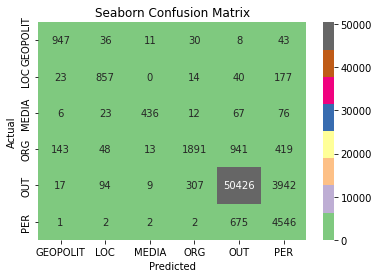

In [25]:
cm = confusion_matrix(valid_y, class_preds_n13)
ax = sns.heatmap(cm, annot=True, fmt='g', cmap="Accent")

ax.set_title('Seaborn Confusion Matrix')
ax.set_xlabel('Predicted')
ax.set_ylabel('Actual')

## For the Tick Labels, the labels should be in Alphabetical order
ax.xaxis.set_ticklabels(['GEOPOLIT', 'LOC', 'MEDIA', 'ORG', 'OUT', 'PER'])
ax.yaxis.set_ticklabels(['GEOPOLIT', 'LOC', 'MEDIA', 'ORG', 'OUT', 'PER'])

plt.show()

In [26]:
vectorize_layer_n4.adapt(text_data)

modeln4 = Sequential([
    vectorize_layer_n4,
    Embedding(vocab_size, embedding_dim),
    Conv1D(embedding_dim, 3),
    Conv1D(embedding_dim, 2),
    GRU(350),
    Dense(200, activation='relu'),
    Dense(6, activation='softmax')
])

modeln4.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(),
              metrics=['accuracy'])

modeln4.fit(train_data, validation_data=valid_data, epochs=3)

Epoch 1/3
6215/6215 [==============================] - 61s 9ms/step - loss: 0.3484 - accuracy: 0.8918 - val_loss: 0.2386 - val_accuracy: 0.9296
Epoch 2/3
6215/6215 [==============================] - 59s 9ms/step - loss: 0.1520 - accuracy: 0.9538 - val_loss: 0.2301 - val_accuracy: 0.9371
Epoch 3/3
6215/6215 [==============================] - 60s 10ms/step - loss: 0.1229 - accuracy: 0.9618 - val_loss: 0.3559 - val_accuracy: 0.8809


In [27]:
labels_predict_n4 = modeln4.predict(valid_data)
class_preds_n4 = np.argmax(tf.nn.softmax(labels_predict_n4), axis=1)
class_preds_n4 = encoder.inverse_transform(class_preds_n4)
# valid_y = encoder.inverse_transform(valid_y)
print(classification_report(valid_y, class_preds_n4))

2072/2072 [==============================] - 7s 3ms/step
              precision    recall  f1-score   support

    GEOPOLIT       0.87      0.89      0.88      1075
         LOC       0.83      0.76      0.79      1111
       MEDIA       0.09      0.81      0.15       620
         ORG       0.84      0.56      0.67      3455
         OUT       0.97      0.92      0.94     54795
         PER       0.98      0.71      0.83      5228

    accuracy                           0.88     66284
   macro avg       0.76      0.77      0.71     66284
weighted avg       0.95      0.88      0.91     66284



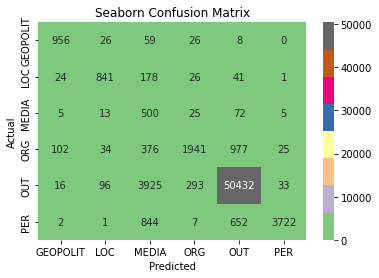

In [28]:
cm = confusion_matrix(valid_y, class_preds_n4)
ax = sns.heatmap(cm, annot=True, fmt='g', cmap="Accent")

ax.set_title('Seaborn Confusion Matrix')
ax.set_xlabel('Predicted')
ax.set_ylabel('Actual')

## For the Tick Labels, the labels should be in Alphabetical order
ax.xaxis.set_ticklabels(['GEOPOLIT', 'LOC', 'MEDIA', 'ORG', 'OUT', 'PER'])
ax.yaxis.set_ticklabels(['GEOPOLIT', 'LOC', 'MEDIA', 'ORG', 'OUT', 'PER'])

plt.show()